In [21]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/aniruddhachoudhury/Red-Wine-Quality/master/winequality-red.csv")

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [5]:
df['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
x = df.drop(columns = 'quality')

In [9]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [10]:
y = df['quality']

In [11]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [12]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size= 0.25, random_state=250)

In [13]:
dt_model = DecisionTreeClassifier()

In [14]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [15]:
dt_model.predict(x_test)

array([6, 7, 7, 4, 5, 5, 7, 7, 6, 7, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 4, 5,
       6, 5, 7, 5, 7, 6, 5, 6, 5, 5, 6, 6, 5, 6, 6, 7, 7, 6, 6, 4, 6, 5,
       6, 5, 5, 5, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6,
       6, 7, 6, 5, 6, 6, 7, 5, 7, 7, 6, 6, 6, 6, 8, 5, 7, 5, 5, 5, 7, 5,
       6, 6, 6, 5, 5, 5, 6, 7, 6, 5, 6, 4, 5, 5, 5, 6, 5, 6, 4, 5, 7, 6,
       6, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 5, 5, 6, 6, 8, 6, 5, 7, 7, 7, 8,
       7, 5, 5, 6, 6, 6, 5, 5, 6, 6, 7, 5, 3, 5, 6, 5, 6, 7, 5, 4, 5, 5,
       6, 5, 6, 7, 6, 5, 7, 8, 7, 6, 5, 4, 6, 6, 6, 8, 6, 6, 5, 7, 7, 5,
       5, 5, 7, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5,
       7, 5, 7, 7, 5, 5, 6, 5, 7, 6, 6, 4, 6, 5, 4, 5, 6, 7, 5, 7, 5, 5,
       6, 6, 5, 7, 6, 5, 7, 6, 6, 5, 6, 5, 6, 5, 6, 5, 6, 7, 6, 5, 6, 6,
       5, 5, 5, 6, 6, 5, 5, 6, 6, 7, 5, 6, 6, 6, 5, 6, 7, 6, 5, 5, 5, 7,
       5, 6, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 7, 5, 5, 7, 6, 5, 4, 3, 5, 6,
       6, 7, 7, 5, 5, 5, 5, 5, 3, 6, 6, 5, 5, 6, 6,

In [16]:
dt_model.score(x_test, y_test)

0.5925

In [17]:
dt_model_1 = DecisionTreeClassifier(criterion="entropy")

In [18]:
dt_model_1.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [19]:
dt_model_1.score(x_test, y_test)

0.6125

In [20]:
outfile = open('dt_model_1_meta.dot', 'w')
tree.export_graphviz(dt_model_1, out_file = outfile, feature_names=x.columns)

In [24]:
# for visuallizing a decision tree
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [25]:
sklearn.__version__

'0.24.2'

[Text(524.7750571024582, 1061.3142857142857, 'X[10] <= 10.15\nentropy = 1.713\nsamples = 1199\nvalue = [6, 47, 508, 479, 147, 12]'),
 Text(200.06278551229065, 1009.5428571428572, 'X[9] <= 0.535\nentropy = 1.343\nsamples = 592\nvalue = [4, 26, 372, 173, 16, 1]'),
 Text(27.675440504676963, 957.7714285714286, 'X[3] <= 1.25\nentropy = 1.021\nsamples = 152\nvalue = [1, 13, 120, 17, 1, 0]'),
 Text(7.768544703067218, 906.0, 'X[6] <= 25.0\nentropy = 1.0\nsamples = 2\nvalue = [1, 0, 0, 0, 1, 0]'),
 Text(3.884272351533609, 854.2285714285715, 'entropy = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 1, 0]'),
 Text(11.652817054600828, 854.2285714285715, 'entropy = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0, 0, 0]'),
 Text(47.58233630628671, 906.0, 'X[8] <= 3.255\nentropy = 0.919\nsamples = 150\nvalue = [0, 13, 120, 17, 0, 0]'),
 Text(19.421361757668045, 854.2285714285715, 'X[3] <= 4.75\nentropy = 0.488\nsamples = 66\nvalue = [0, 0, 59, 7, 0, 0]'),
 Text(15.537089406134436, 802.4571428571429, 'X[0] <= 8.35\nent

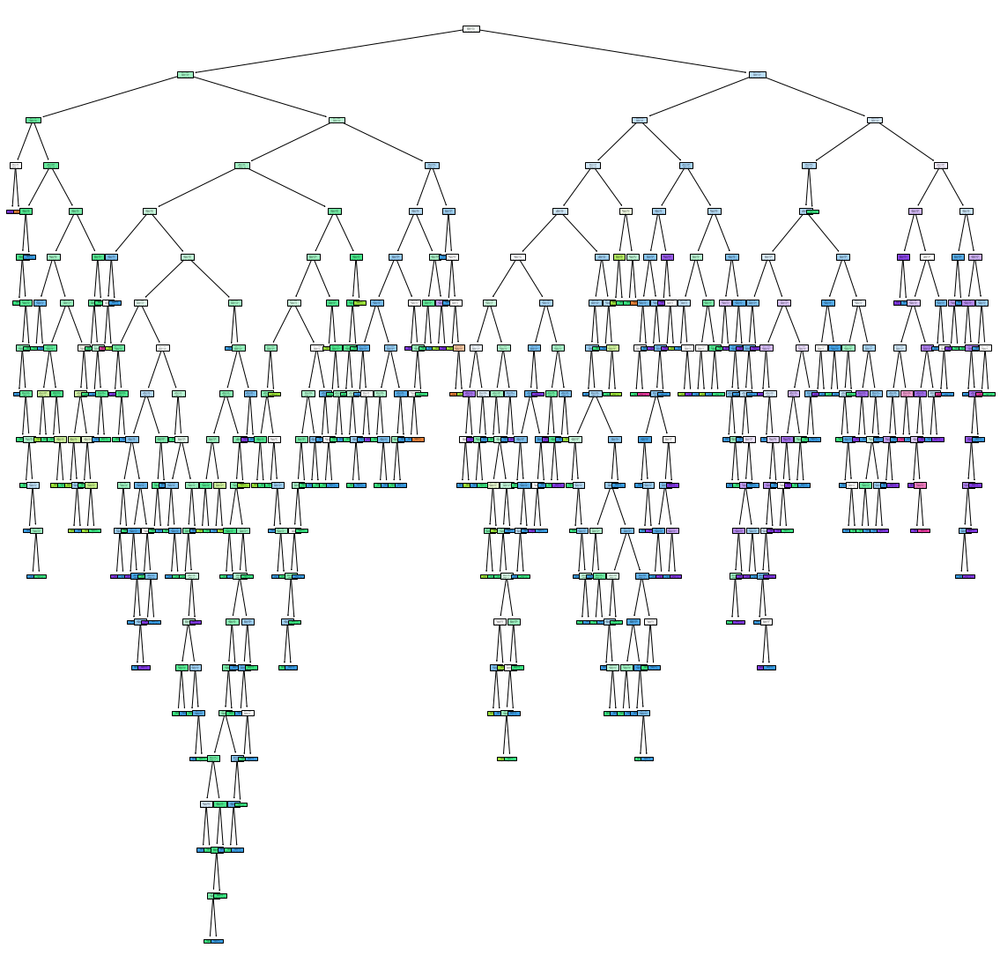

In [28]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_1, filled = True)

In [102]:
df1 = df.head(500)

In [103]:
x1 = df1.drop(columns = 'quality')

In [104]:
y1 = df1.quality

In [105]:
dt_model_2 = DecisionTreeClassifier()

In [106]:
dt_model_2.fit(x1, y1)

DecisionTreeClassifier()

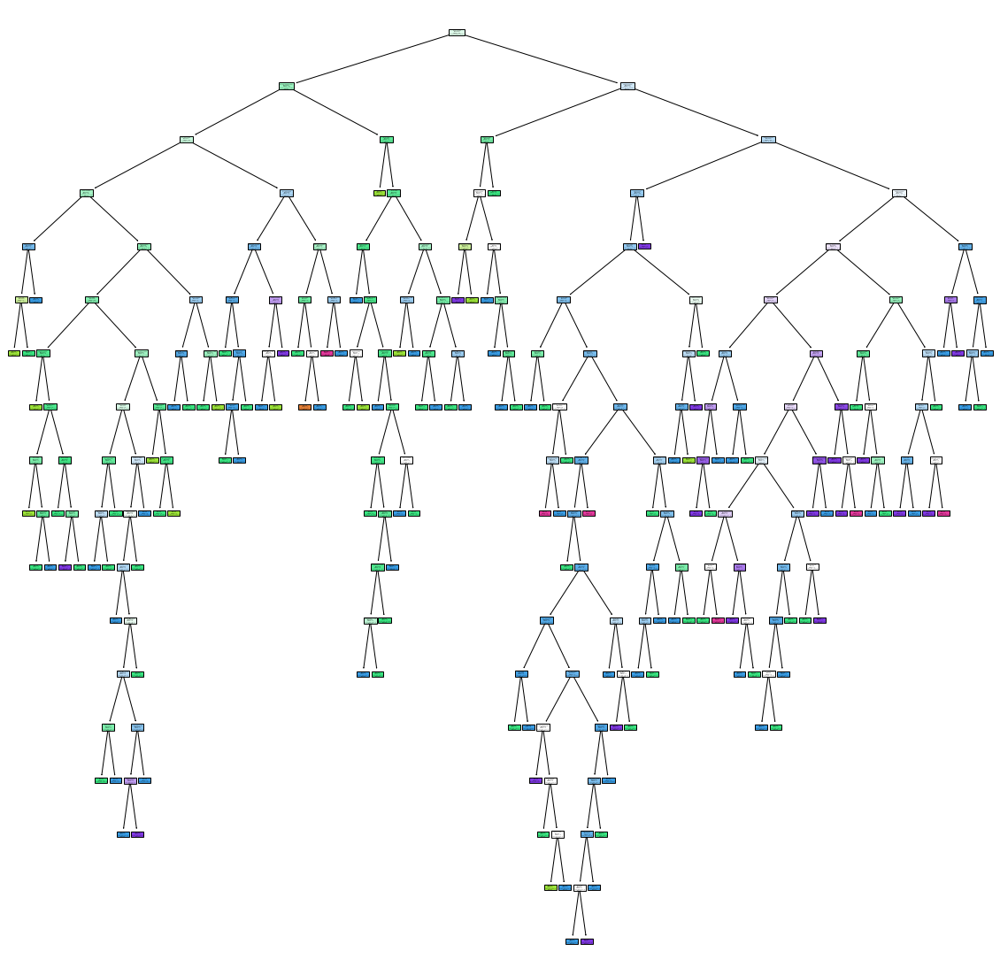

In [107]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_2, filled=True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig('dt_model_2')

In [108]:
dt_model_2.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [109]:
dt_model_2.score(x1,y1)

1.0

In [110]:
dt_model_2.score(x_train, y_train)

0.5904920767306089

In [111]:
dt_model_2.score(x_test, y_test)

0.635

In [112]:
path = dt_model_2.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [113]:
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00203333, 0.00247552, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
        0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
        0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
        0.00363636, 0.00373333, 0.00373809, 0.0038    , 0.0038237 ,
        0.004     , 0.00404444, 0.00428571, 0.00428571, 0.00437662,
        0.00462338, 0.00465709, 0.00466667, 0.0048    , 0.00487179,
        0.00504242, 0.00508235, 0.00509091, 0.00510606, 0.00516667,
        0.00568485, 0.00589394, 0.

In [114]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00203333, 0.00247552, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
       0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
       0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
       0.00363636, 0.00373333, 0.00373809, 0.0038    , 0.0038237 ,
       0.004     , 0.00404444, 0.00428571, 0.00428571, 0.00437662,
       0.00462338, 0.00465709, 0.00466667, 0.0048    , 0.00487179,
       0.00504242, 0.00508235, 0.00509091, 0.00510606, 0.00516667,
       0.00568485, 0.00589394, 0.00656364, 0.00671079, 0.00675

In [115]:
dt_model_3 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = ccp)
    dt_m.fit(x1,y1)
    dt_model_3.append(dt_m)

In [116]:
dt_model_3

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.00262769230

In [117]:
train_score_main = [i.score(x_train, y_train) for i in dt_model_3]

In [118]:
train_score_main

[0.6013344453711427,
 0.5871559633027523,
 0.5688073394495413,
 0.5779816513761468,
 0.5796497080900751,
 0.5704753961634695,
 0.6005004170141784,
 0.5746455379482902,
 0.5821517931609674,
 0.5896580483736447,
 0.5921601334445371,
 0.5738115095913261,
 0.5613010842368641,
 0.5946622185154296,
 0.5863219349457881,
 0.5713094245204337,
 0.5821517931609674,
 0.5721434528773979,
 0.5713094245204337,
 0.5904920767306089,
 0.5904920767306089,
 0.5779816513761468,
 0.572977481234362,
 0.5996663886572143,
 0.5763135946622185,
 0.5904920767306089,
 0.5946622185154296,
 0.5829858215179317,
 0.6030025020850709,
 0.6005004170141784,
 0.6071726438698916,
 0.572977481234362,
 0.5829858215179317,
 0.5988323603002502,
 0.5954962468723937,
 0.5704753961634695,
 0.572977481234362,
 0.5663052543786489,
 0.5821517931609674,
 0.5796497080900751,
 0.585487906588824,
 0.591326105087573,
 0.585487906588824,
 0.5813177648040033,
 0.5788156797331109,
 0.5788156797331109,
 0.6080066722268557,
 0.6021684737281068

In [119]:
train_score = [i.score(x1,y1) for i in dt_model_3]

In [120]:
test_score = [i.score(x_test, y_test) for i in dt_model_3]

In [121]:
train_score

[1.0,
 0.998,
 0.998,
 0.994,
 0.992,
 0.986,
 0.986,
 0.96,
 0.964,
 0.966,
 0.964,
 0.96,
 0.962,
 0.964,
 0.962,
 0.962,
 0.962,
 0.96,
 0.958,
 0.948,
 0.948,
 0.93,
 0.928,
 0.928,
 0.928,
 0.928,
 0.93,
 0.93,
 0.934,
 0.932,
 0.928,
 0.912,
 0.914,
 0.918,
 0.912,
 0.918,
 0.914,
 0.912,
 0.908,
 0.91,
 0.904,
 0.896,
 0.9,
 0.896,
 0.892,
 0.888,
 0.884,
 0.886,
 0.882,
 0.878,
 0.882,
 0.88,
 0.874,
 0.87,
 0.862,
 0.854,
 0.858,
 0.848,
 0.856,
 0.842,
 0.848,
 0.824,
 0.828,
 0.824,
 0.824,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.558]

In [122]:
test_score

[0.625,
 0.6025,
 0.615,
 0.6175,
 0.6375,
 0.615,
 0.6425,
 0.62,
 0.6,
 0.625,
 0.61,
 0.6,
 0.5975,
 0.6075,
 0.6125,
 0.6075,
 0.6175,
 0.615,
 0.6125,
 0.6275,
 0.6225,
 0.62,
 0.605,
 0.6275,
 0.6225,
 0.61,
 0.6275,
 0.6125,
 0.6225,
 0.62,
 0.6175,
 0.6025,
 0.62,
 0.62,
 0.605,
 0.61,
 0.6075,
 0.6,
 0.61,
 0.605,
 0.5975,
 0.62,
 0.595,
 0.6,
 0.5975,
 0.6025,
 0.6075,
 0.6075,
 0.605,
 0.6,
 0.6025,
 0.6075,
 0.605,
 0.62,
 0.615,
 0.6125,
 0.6175,
 0.6075,
 0.615,
 0.6175,
 0.615,
 0.615,
 0.6175,
 0.6175,
 0.62,
 0.6175,
 0.62,
 0.605,
 0.6025,
 0.6025,
 0.6,
 0.61,
 0.61,
 0.6075,
 0.6125,
 0.61,
 0.615,
 0.615,
 0.62,
 0.615,
 0.62,
 0.605,
 0.605,
 0.5925,
 0.5875,
 0.5875,
 0.5875,
 0.5825,
 0.5825,
 0.5825,
 0.5575,
 0.5575]

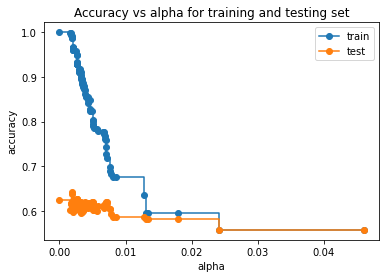

In [123]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing set')
ax.plot(ccp_alpha, train_score, marker = 'o', label = "train", drawstyle = "steps-post")
ax.plot(ccp_alpha, test_score, marker = 'o', label = "test", drawstyle = "steps-post")
ax.legend()
plt.show()

### if our model is overfitted than to remove overfitting first approach is to increase a training dataset and then check

In [124]:
dt_model_5 = DecisionTreeClassifier(random_state=0, ccp_alpha=0.016)
dt_model_5.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.016, random_state=0)

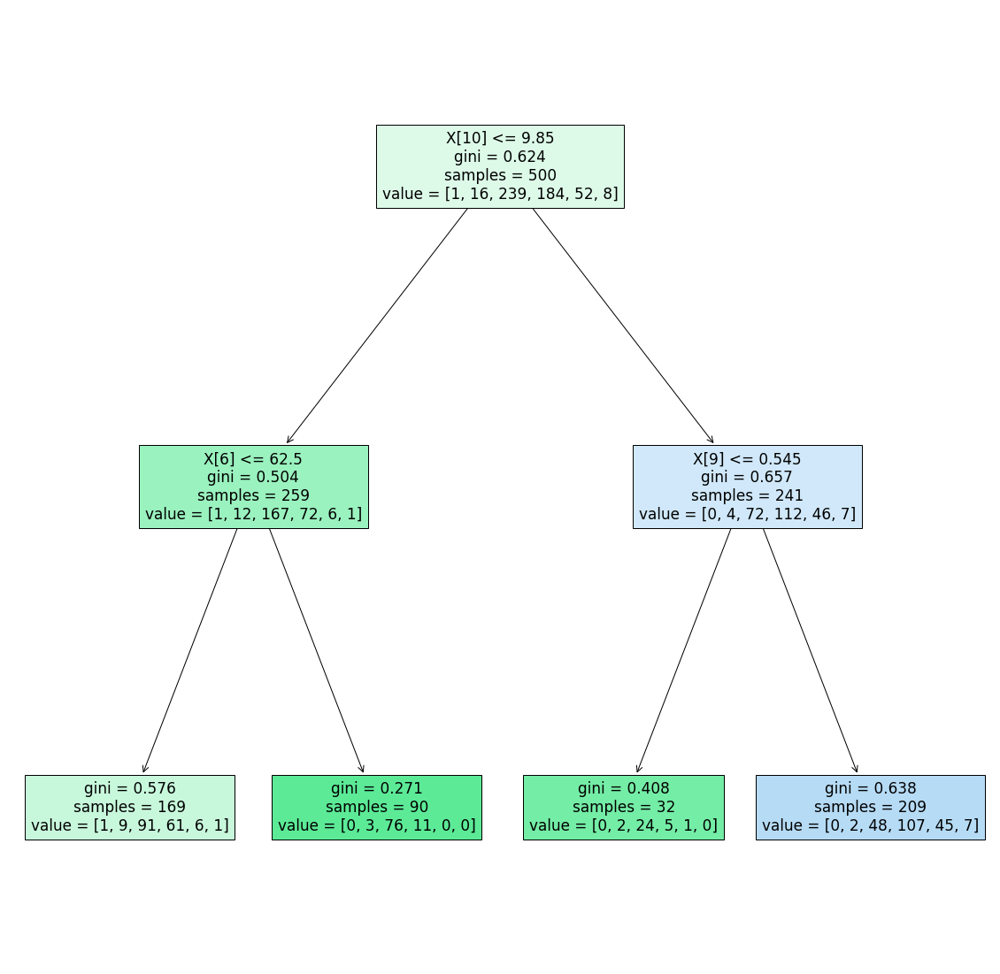

In [125]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_5, filled = True)
plt.savefig('dt_model_5')

In [126]:
df1['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [127]:
dt_model_5.score(x1, y1)

0.596

In [128]:
dt_model_5.score(x_test, y_test)

0.5825

In [129]:
dt_model_6 = DecisionTreeClassifier(random_state=0, ccp_alpha=0.019)
dt_model_6.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.019, random_state=0)

[Text(446.4, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(223.2, 543.6, 'gini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(669.5999999999999, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(446.4, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(892.8, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

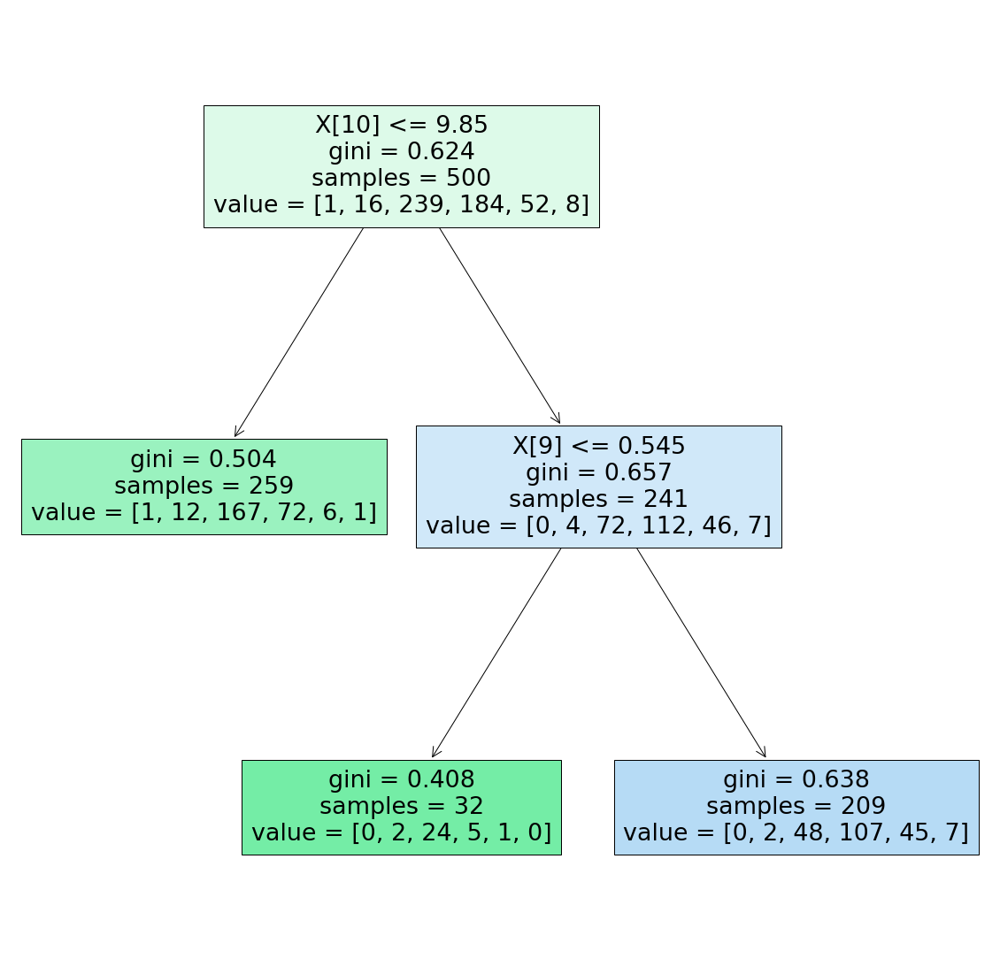

In [130]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_6, filled=True)

In [131]:
dt_model_6.score(x1,y1)

0.596

In [132]:
dt_model_6.score(x_test, y_test)

0.5825

In [133]:
dt_model_7 = DecisionTreeClassifier(random_state=0, ccp_alpha=0.025)
dt_model_7.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.025, random_state=0)

[Text(558.0, 815.4000000000001, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 271.79999999999995, 'gini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(837.0, 271.79999999999995, 'gini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]')]

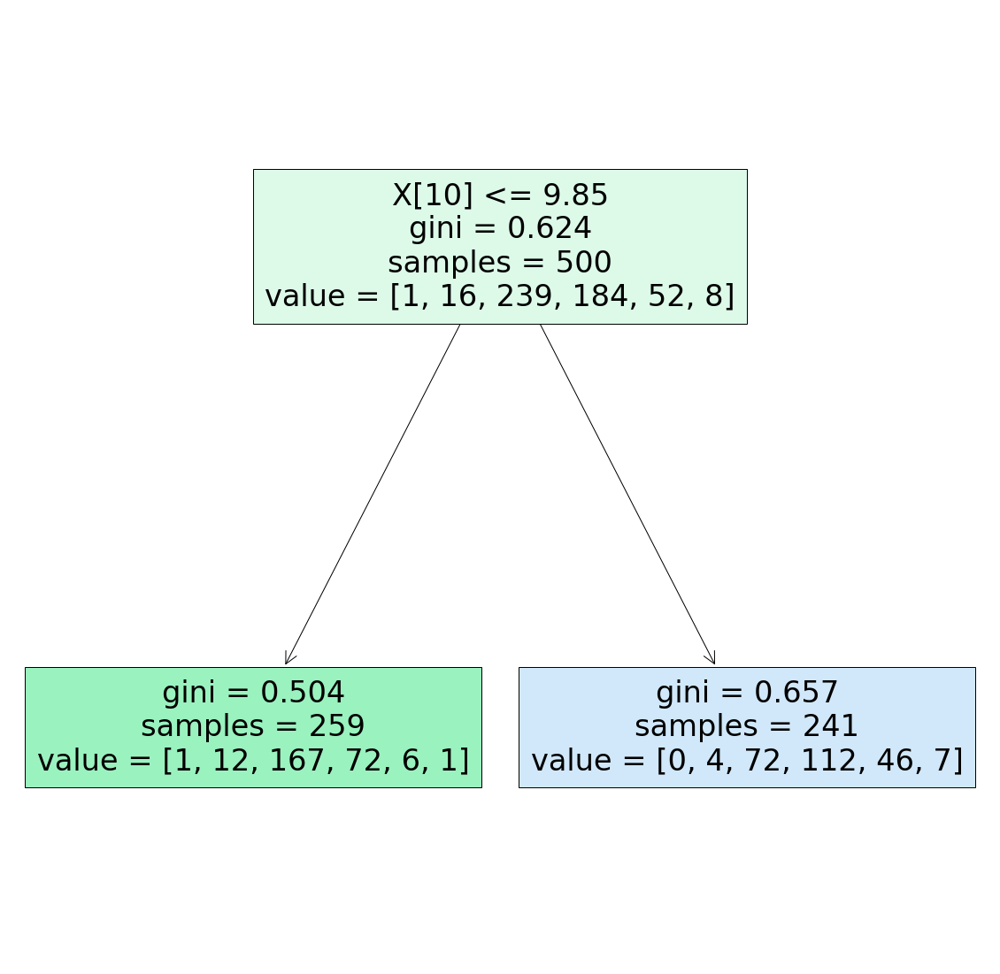

In [135]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_7, filled = True)

In [138]:
dt_model_7.score(x_train, y_train)

0.5521267723102585

In [136]:
dt_model_7.score(x1,y1)

0.558

In [137]:
dt_model_7.score(x_test, y_test)

0.5575

In [ ]:
DecisionTreeClassifier()

In [140]:
grid_parm = {'criterion':['gini', 'entropy'],
              'splitter':['best', 'random'],
              'max_depth':range(2,40,1),
              'min_samples_split': range(2,10,1),
              'min_samples_leaf': range(1,10,1)
             }

In [141]:
grid_dt_model_7 = GridSearchCV(estimator=dt_model_7, param_grid = grid_parm, cv = 5, n_jobs=-1)

In [142]:
grid_dt_model_7.fit(x1,y1)

C:\Users\ts-sachin.bhumihar\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.025, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [143]:
grid_dt_model_7.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 1,
 'min_samples_split': 9,
 'splitter': 'random'}

In [150]:
dt_model_8 = DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=1, min_samples_split=9, splitter='random', ccp_alpha=0.025)

In [151]:
dt_model_8.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.025, criterion='entropy', max_depth=15,
                       min_samples_split=9, splitter='random')

In [152]:
dt_model_8.score(x1,y1)

0.596

In [153]:
dt_model_8.score(x_test, y_test)

0.5625

In [154]:
dt_model_8.score(x_train,y_train)

0.5454545454545454

In [155]:
pred = dt_model_8.predict(x_train)

In [156]:
pred

array([6, 5, 5, ..., 6, 5, 6], dtype=int64)

In [157]:
confusion_matrix(y_train, pred)

array([[  0,   0,   4,   2,   0,   0],
       [  0,   0,  35,  11,   1,   0],
       [  0,   0, 363, 138,   7,   0],
       [  0,   0, 191, 278,  10,   0],
       [  0,   0,  25, 109,  13,   0],
       [  0,   0,   2,  10,   0,   0]], dtype=int64)